In this project, you'll be exploring a few uses of gradients.

In the first part of the project, you'll see how gradients can be used to explain predictions from a model. You'll be using the gradients as a way to see which parts of the input the model relied on when making its predictions.

## Google Colab Setup
The following part only applies to users using Google Colab. If you're not using Colab, feel free to delete this.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
datadir = "/path/to/your/notebook" # path to the project
if not os.path.exists(datadir):
  !ln -s "" $datadir # path to the homework
os.chdir(datadir)
!pwd

/content/drive/MyDrive/Colab Notebooks/Intro to DL Course/HW3/part2


In [ ]:
import torch
from torch.autograd import Variable
import torchvision
import torchvision.transforms as Trans
import random
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import models

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of figures
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

<ipython-input-3-b7b01c140066>:7: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


### Preprocessing

Remember, before using a model, we need to ensure our data is preprocessed correctly. We'll use the defaults (and ignore the center cropping). [See here](https://github.com/pytorch/vision/blob/2c4665ffbb64f03f5d18016d3398af4ac4da5f03/torchvision/transforms/_presets.py#L57) for where we can find this comes from. In practice, you usually don't need to undo the transform, so you can just use a model like so:
```
# Initialize the Weight Transforms
weights = ResNet50_Weights.DEFAULT
preprocess = weights.transforms()

# Apply it to the input image
img_transformed = preprocess(img)

# Initialize model
weights = ResNet50_Weights.DEFAULT
model = resnet50(weights=weights)

# Set model to eval mode
model.eval()

```
However, we'll be manually doing the processing in here so we can deprocess it (i.e. undo the transformation).

In [ ]:
def preprocess(img, size=224):
    transform = Trans.Compose([
        Trans.Resize(size),
        Trans.ToTensor(),
        Trans.Normalize(mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]),
    ])
    return transform(img)

def deprocess(img, should_rescale=True):
    transform = Trans.Compose([
        Trans.Normalize(mean=[0, 0, 0], std=[1.0/0.229, 1.0/0.224, 1.0/0.225]),
        Trans.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
        Trans.ToPILImage(),
    ])
    return transform(img)

## Loading ResNet18

In [ ]:
# Download and load the pretrained ResNet18 model.
resnet18 = models.resnet18(pretrained=True)
resnet18.eval()

# We're not going to be training the model, so disable gradient computation for the parameters.
for param in resnet18.parameters():
    param.requires_grad = False

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Load provided sample ImageNet images

With this project, I've included a few images from the validation set from ImageNet.

They are in the "imagenet_data" folder.

Below we'll visualize a few images.

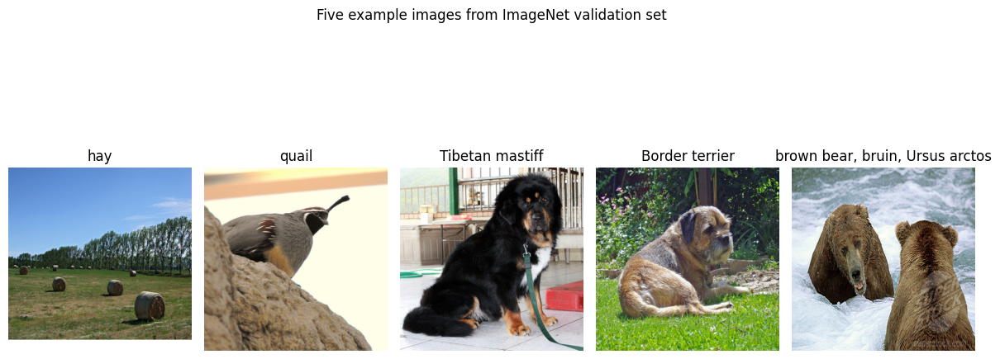

In [ ]:
def load_data(num=None):
    data_path = './imagenet_data.npz'
    f = np.load(data_path, allow_pickle=True)
    X = f['X']
    y = f['y']
    class_names = f['label_map'].item()
    if num is not None:
        X = X[:num]
        y = y[:num]
    return X, y, class_names


X, y, class_names = load_data(num=5)  # X is a numpy array of size [5, 224, 224, 3] (5 images)
# y is a list of the class indices (there are 1000 indices, each corresponding to a different class)
# the class names variable shows the list that maps each index to the class name. Feel free to print this out.

plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.suptitle('Five example images from ImageNet validation set')
plt.gcf().tight_layout()

## Explaining model predictions

First, we will be looking at how each pixel in the input image affects the prediction. The idea is that if we compute the gradient with respect to each pixel, we'll be able to understand how much the output changes if that pixel changes.

We'll use a very simple strategy for this. To compute the attention map, you'll first compute the gradient with respect to the input image. Remember, there are three input channels, so your gradient will be the same size as the input image. We aren't going to consider the differences between positive vs negative gradients here, so you'll take the absolute value of the gradient, and then take the max gradient value across the red, green, and blue channels. When finished, you'll get an attention map the same size of the input that essentially tells us how important that pixel is for the prediction. Note that this is the technique explained in section 3.1 of [this paper](https://arxiv.org/pdf/1312.6034.pdf), if you are curious. The same idea can be applied to language models like transformers as well, by computing attention scores for each token (which roughly corresponds to words).

In [ ]:
def compute_attention_maps(X, y, model):
    """
    Compute the attention map for each image X and label y
    Return an attention map of shape (N, H, W), where N is number of images,
    H and W are height and width of the images.
    """
    model.eval()

    # Ensure X requires gradients
    X.requires_grad_(True)

    # Forward pass to get model outputs
    outputs = model(X)

    # Focus on the correct class
    correct_class_scores = outputs.gather(1, y.unsqueeze(-1)).squeeze()

    # Compute gradients
    model.zero_grad()  # Reset gradients to zero to avoid accumulation
    correct_class_scores.backward(torch.ones_like(correct_class_scores))

    # Gradients with respect to input images
    gradients = X.grad

    # Taking the absolute value of the gradients and then max across the color channels
    gradients_abs = gradients.abs()
    attention_maps = gradients_abs.max(dim=1)[0]

    # Normalizing the attention maps
    N, H, W = attention_maps.shape
    attention_maps = attention_maps.view(N, -1)
    attention_maps -= attention_maps.min(1, keepdim=True)[0]
    attention_maps /= attention_maps.max(1, keepdim=True)[0]
    attention_maps = attention_maps.view(N, H, W)

    return attention_maps

#### Visualizing results

Here, we'll visualize some examples. Feel free to check with the paper to compare your results.

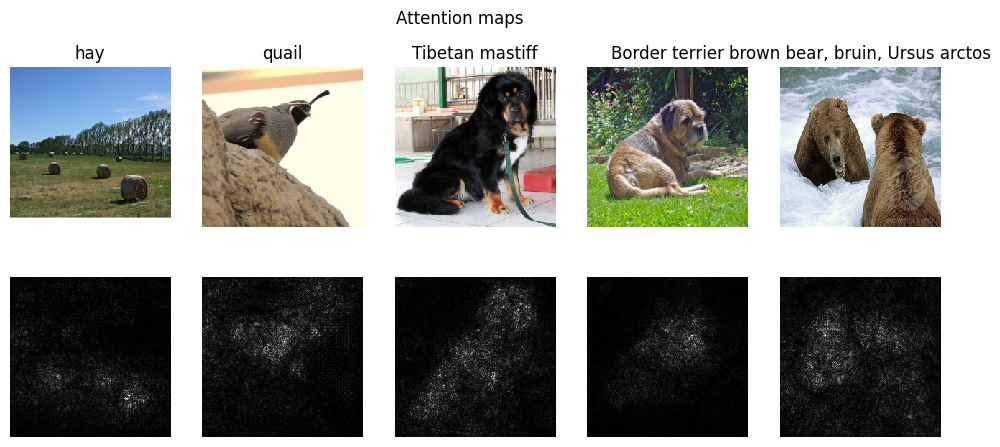

In [ ]:
def show_attention_maps(X, y):
    # X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
    X_tensor = torch.stack([preprocess(Image.fromarray(x)) for x in X])
    y_tensor = torch.LongTensor(y)
    attention = compute_attention_maps(X_tensor, y_tensor, resnet18)
    attention = attention.numpy()

    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(attention[i], cmap=plt.cm.gray)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.suptitle('Attention maps')
    plt.show()

show_attention_maps(X, y)

## Adversarial examples

In the second part of this project, you'll learn how to create adversarial examples, again using gradient techniques. You'll implement two techniques, specifically the **fast gradient sign method** and the **iterative gradient sign method**.

You're encouraged to read the following two papers to get more details on those methods:

* Kurakin, Alexey, Ian J. Goodfellow, and Samy Bengio. [Adversarial examples in the physical world.](https://arxiv.org/pdf/1607.02533.pdf)  You'll be implementing the fast method and the basic iterative method described in section 2.1 and 2.2 in this paper.
* Goodfellow, Ian J., Jonathon Shlens, and Christian Szegedy. [Explaining and harnessing adversarial examples.](https://arxiv.org/pdf/1412.6572.pdf)  (this is the paper where the fast method came from)

Implement the fast gradient sign method and the basic iterative method described in the paper above. For the iterative method, set the number of iterations according to formula in paper.
For both methods, explore $\epsilon \in \{2,4,8,16\}$.

In [ ]:
def fast_gradient_sign_method(X, y_true, model, eps):

    model.eval()
    # Make sure X requires gradient
    X.requires_grad_(True)

    # Forward pass
    outputs = model(X)
    loss = torch.nn.functional.cross_entropy(outputs, y_true)

    # Zero existing gradients
    model.zero_grad()

    # Backward pass to get gradients of loss with respect to the input
    loss.backward()

    # Apply FGSM:
    X_prime = X + eps * X.grad.sign()

    # Detach the result to stop tracking gradients
    return X_prime.detach()


In [ ]:
def iterative_method(X, y_true, model, eps):
    alpha = 1 # According to the paper
    iters = int(min(eps + 4, 1.25 * eps)) # According to the paper

    model.eval()

    # Initialize perturbed image as the original image
    X_prime = X.clone().detach().requires_grad_(True)

    # Iteratively apply perturbations
    for _ in range(iters):
        outputs = model(X_prime)
        loss = torch.nn.functional.cross_entropy(outputs, y_true)

        # Zero existing gradients
        model.zero_grad()

        # Backward pass
        loss.backward()

        # Apply perturbation
        X_prime = X_prime + alpha * X_prime.grad.sign()

        # Clip X_prime to ensure it's within the epsilon neighborhood of X
        eta = torch.clamp(X_prime - X, min=-eps, max=eps)
        X_prime = (X + eta).detach().requires_grad_(True)

    # Detach the final result to stop tracking gradients
    return X_prime.detach()

Probability of correct class hay before: 0.9999176263809204
Probability of correct class "hay" for method FGSM and epsilon 2 after: 0.0001


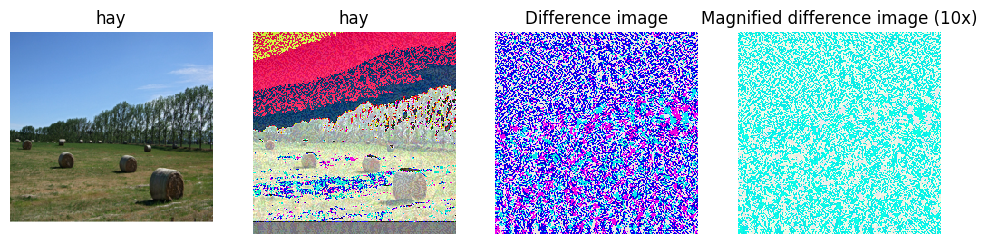

Probability of correct class "hay" for method Iterative and epsilon 2 after: 0.0000


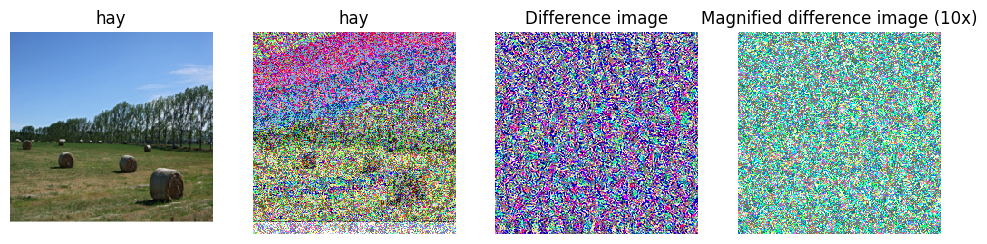

Probability of correct class "hay" for method FGSM and epsilon 4 after: 0.0000


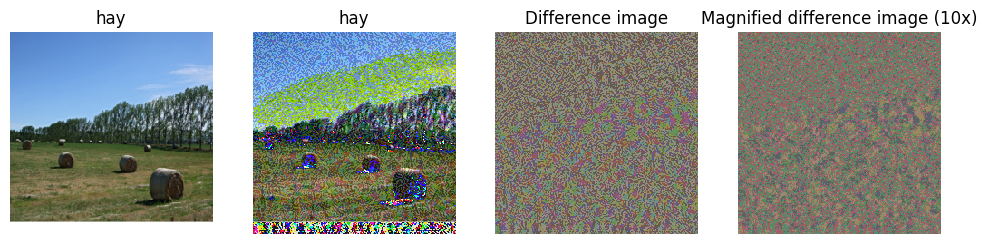

Probability of correct class "hay" for method Iterative and epsilon 4 after: 0.0000


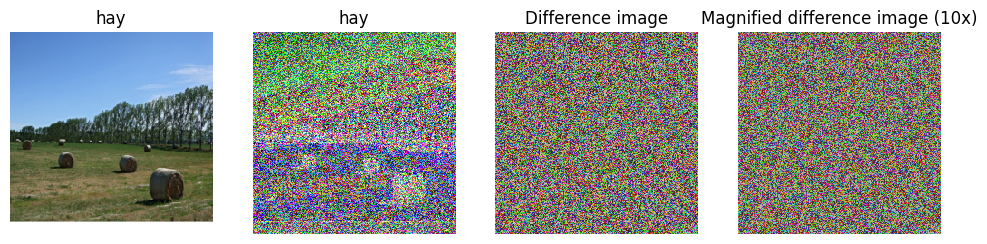

Probability of correct class "hay" for method FGSM and epsilon 8 after: 0.0000


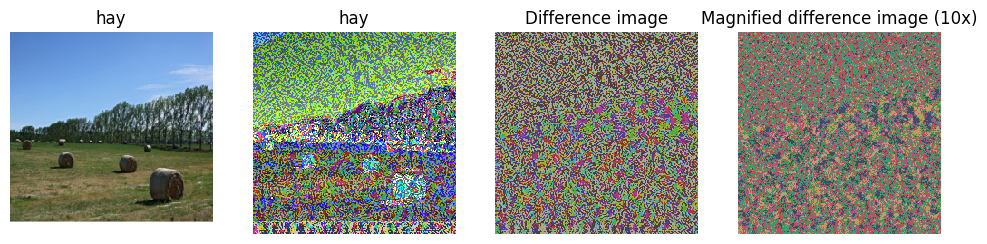

Probability of correct class "hay" for method Iterative and epsilon 8 after: 0.0000


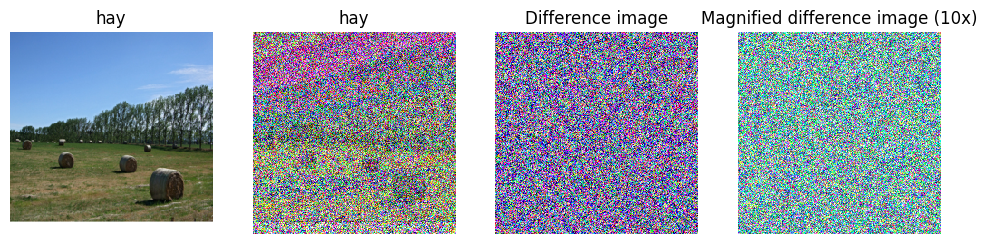

Probability of correct class "hay" for method FGSM and epsilon 16 after: 0.0000


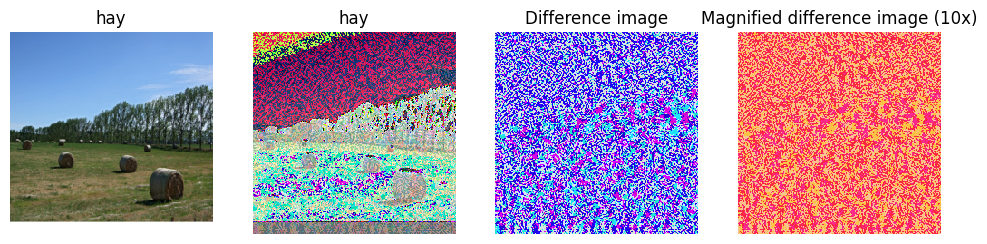

Probability of correct class "hay" for method Iterative and epsilon 16 after: 0.0000


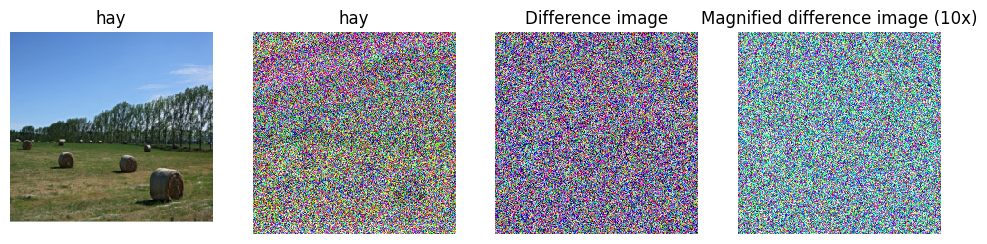

Probability of correct class quail before: 0.5927480459213257
Probability of correct class "quail" for method FGSM and epsilon 2 after: 0.0000


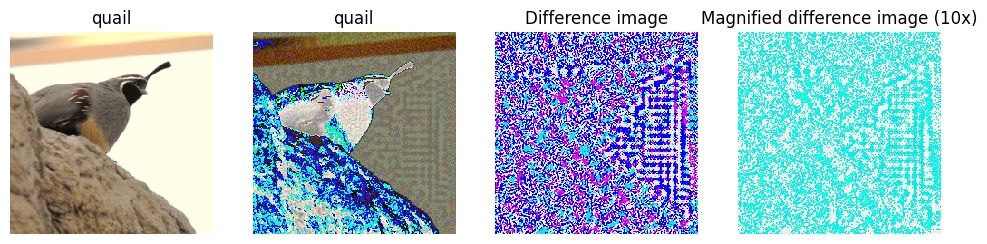

Probability of correct class "quail" for method Iterative and epsilon 2 after: 0.0000


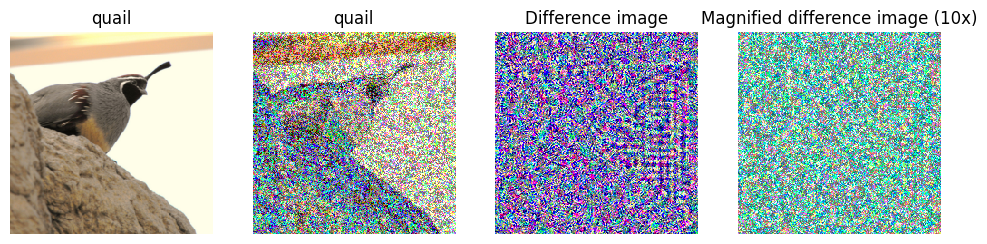

Probability of correct class "quail" for method FGSM and epsilon 4 after: 0.0000


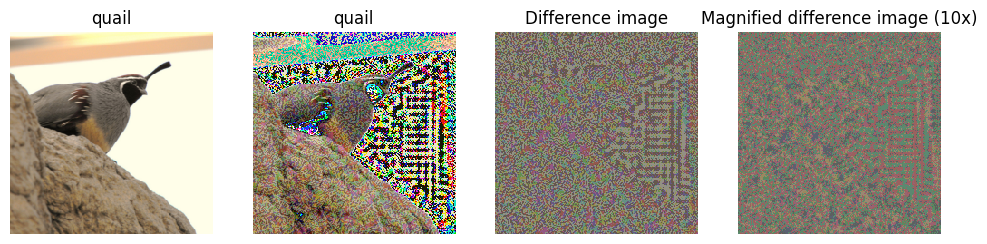

Probability of correct class "quail" for method Iterative and epsilon 4 after: 0.0000


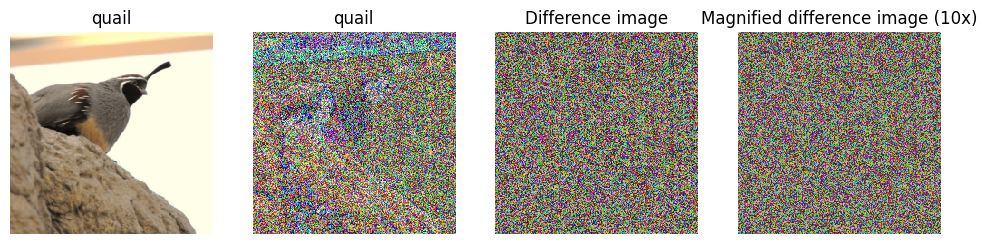

Probability of correct class "quail" for method FGSM and epsilon 8 after: 0.0000


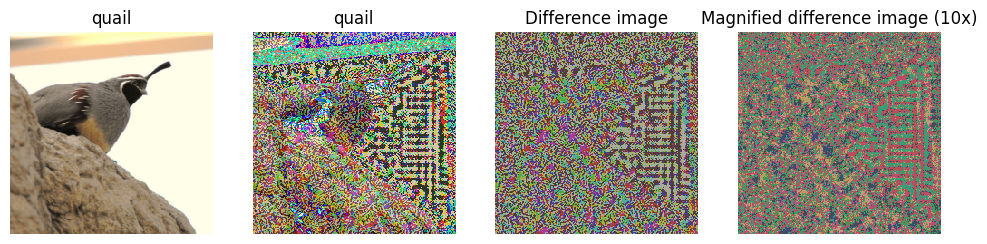

Probability of correct class "quail" for method Iterative and epsilon 8 after: 0.0000


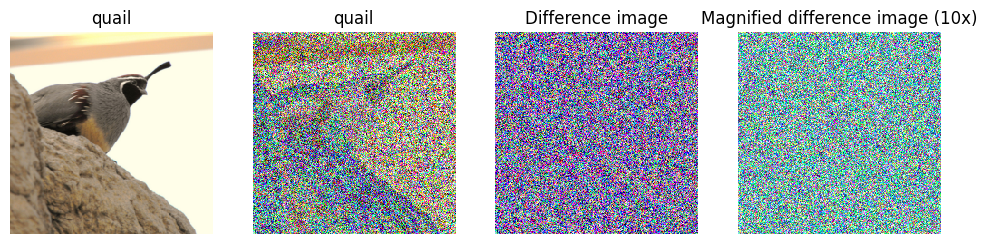

Probability of correct class "quail" for method FGSM and epsilon 16 after: 0.0000


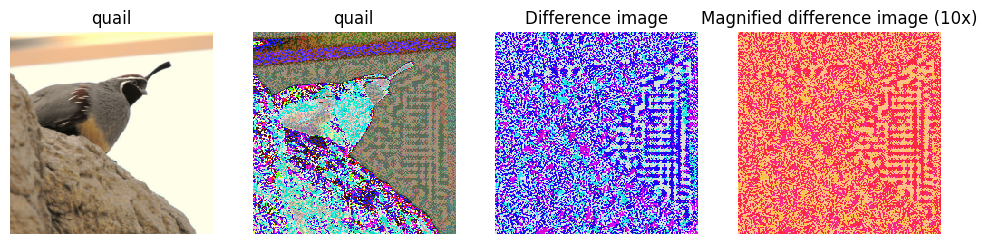

Probability of correct class "quail" for method Iterative and epsilon 16 after: 0.0000


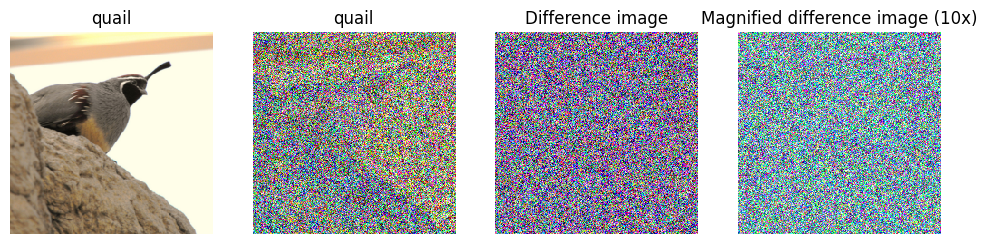

Probability of correct class Tibetan mastiff before: 0.9066084027290344
Probability of correct class "Tibetan mastiff" for method FGSM and epsilon 2 after: 0.0000


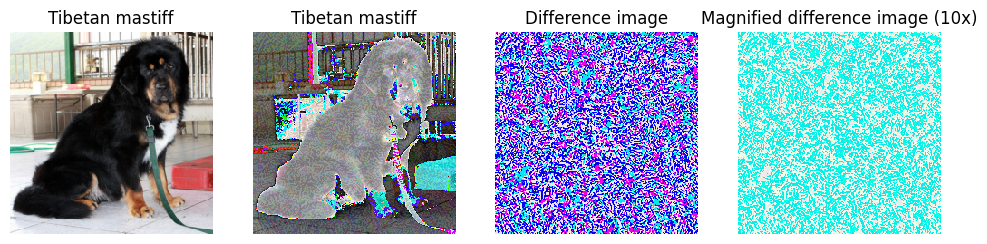

Probability of correct class "Tibetan mastiff" for method Iterative and epsilon 2 after: 0.0000


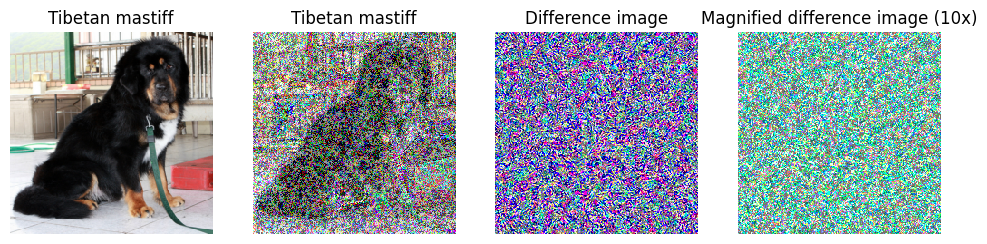

Probability of correct class "Tibetan mastiff" for method FGSM and epsilon 4 after: 0.0000


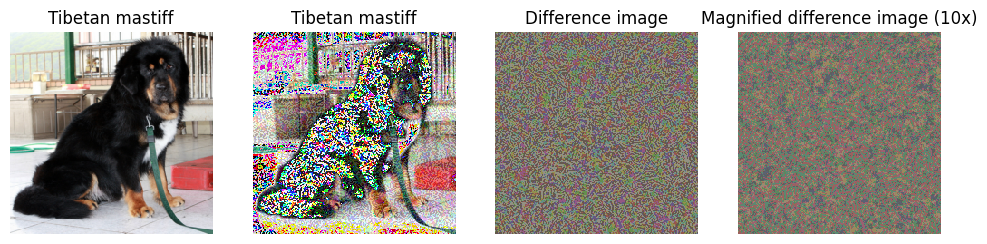

Probability of correct class "Tibetan mastiff" for method Iterative and epsilon 4 after: 0.0000


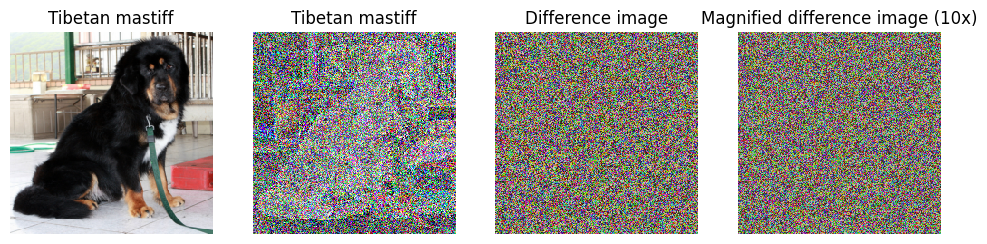

Probability of correct class "Tibetan mastiff" for method FGSM and epsilon 8 after: 0.0000


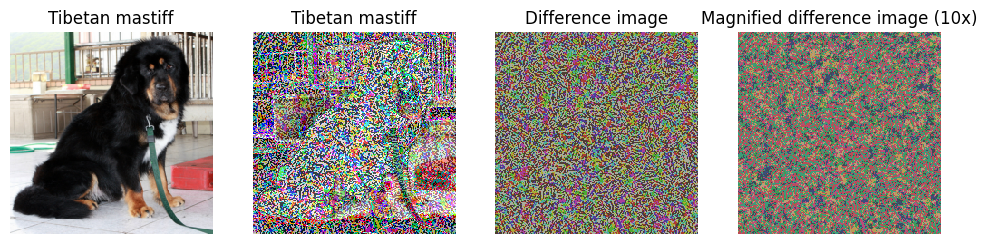

Probability of correct class "Tibetan mastiff" for method Iterative and epsilon 8 after: 0.0000


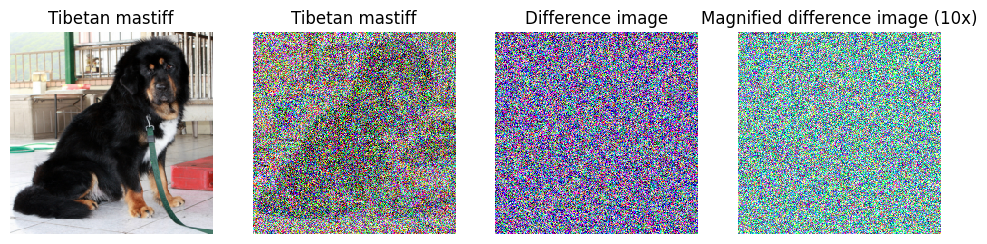

Probability of correct class "Tibetan mastiff" for method FGSM and epsilon 16 after: 0.0000


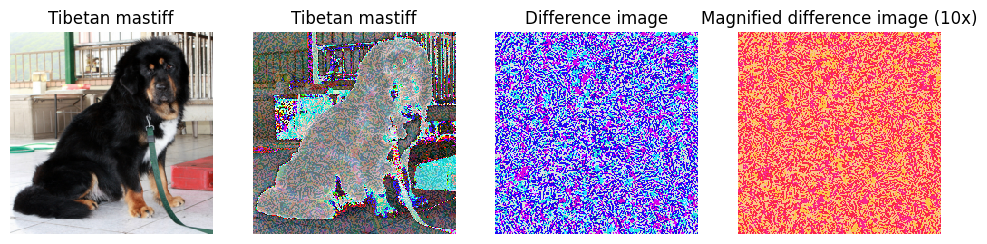

Probability of correct class "Tibetan mastiff" for method Iterative and epsilon 16 after: 0.0000


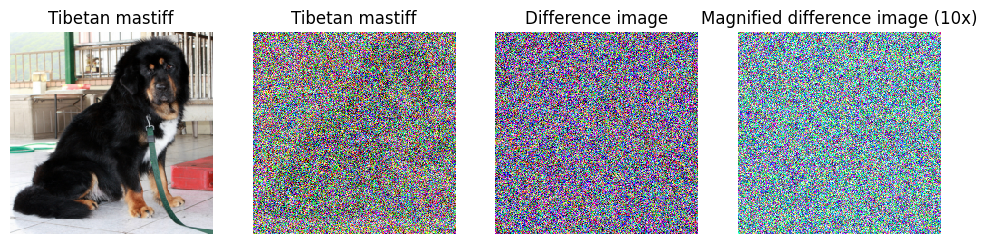

Probability of correct class Border terrier before: 0.8986451625823975
Probability of correct class "Border terrier" for method FGSM and epsilon 2 after: 0.0000


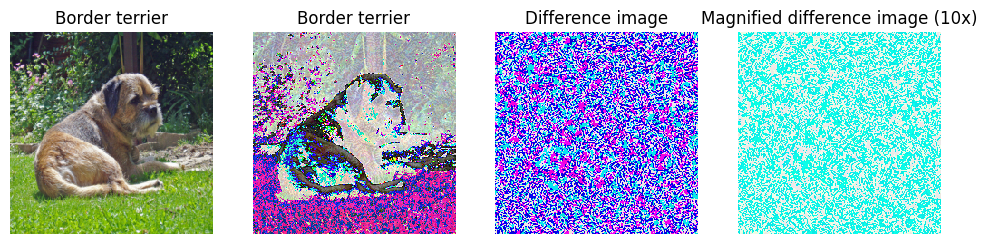

Probability of correct class "Border terrier" for method Iterative and epsilon 2 after: 0.0000


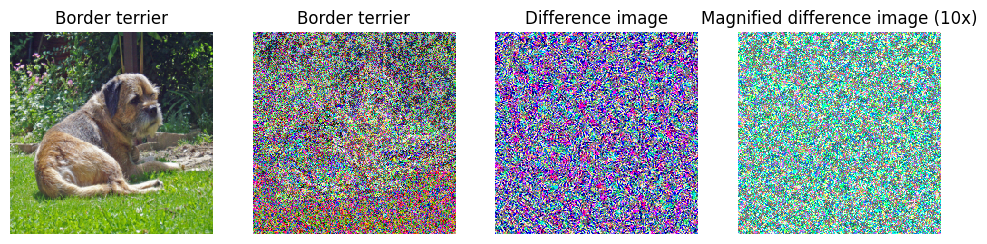

Probability of correct class "Border terrier" for method FGSM and epsilon 4 after: 0.0000


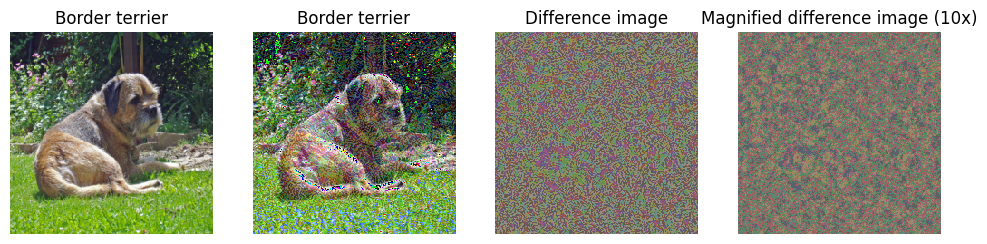

Probability of correct class "Border terrier" for method Iterative and epsilon 4 after: 0.0000


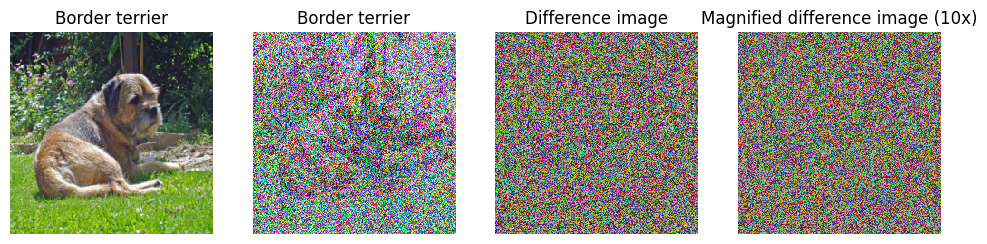

Probability of correct class "Border terrier" for method FGSM and epsilon 8 after: 0.0000


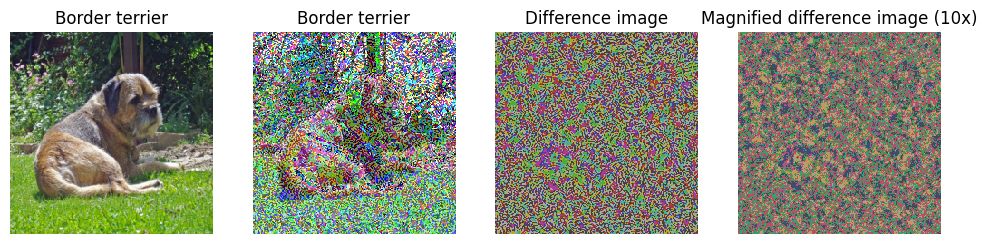

Probability of correct class "Border terrier" for method Iterative and epsilon 8 after: 0.0000


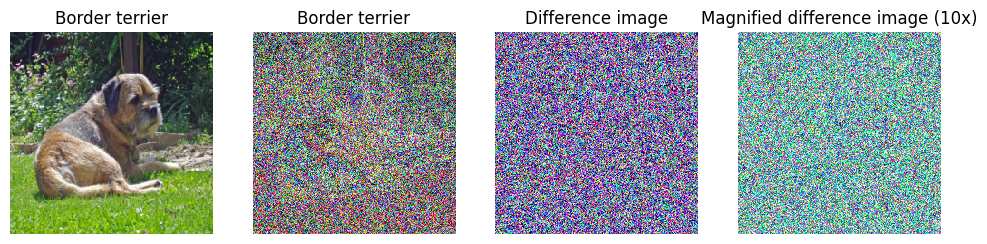

Probability of correct class "Border terrier" for method FGSM and epsilon 16 after: 0.0000


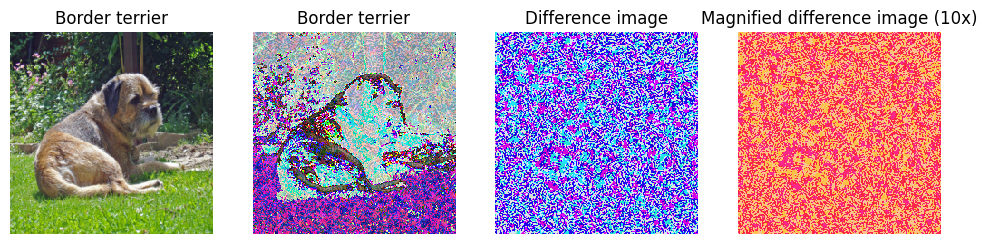

Probability of correct class "Border terrier" for method Iterative and epsilon 16 after: 0.0000


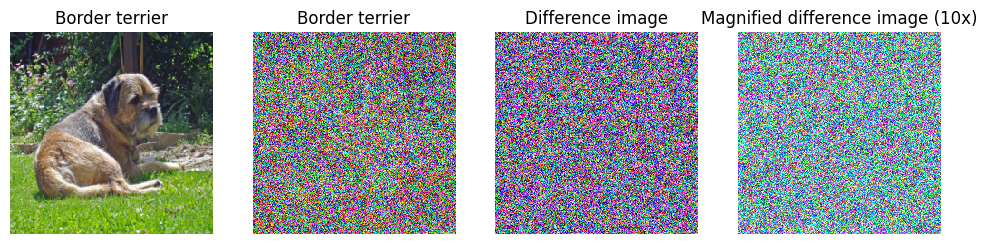

Probability of correct class brown bear, bruin, Ursus arctos before: 0.9969670176506042
Probability of correct class "brown bear, bruin, Ursus arctos" for method FGSM and epsilon 2 after: 0.0000


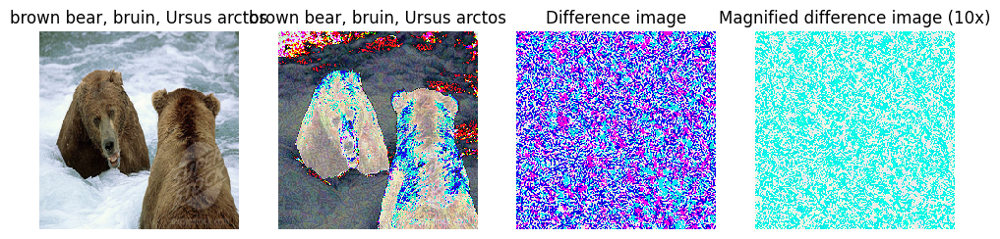

Probability of correct class "brown bear, bruin, Ursus arctos" for method Iterative and epsilon 2 after: 0.0000


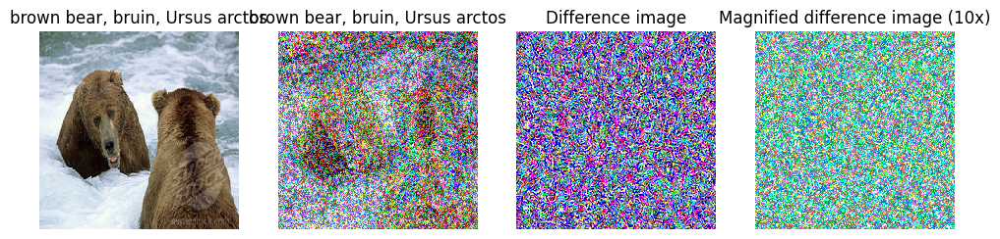

Probability of correct class "brown bear, bruin, Ursus arctos" for method FGSM and epsilon 4 after: 0.0000


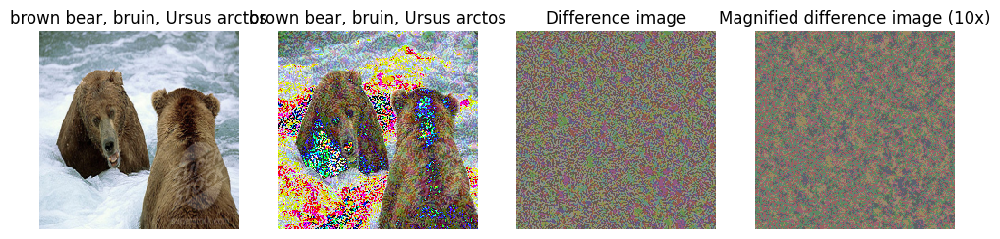

Probability of correct class "brown bear, bruin, Ursus arctos" for method Iterative and epsilon 4 after: 0.0000


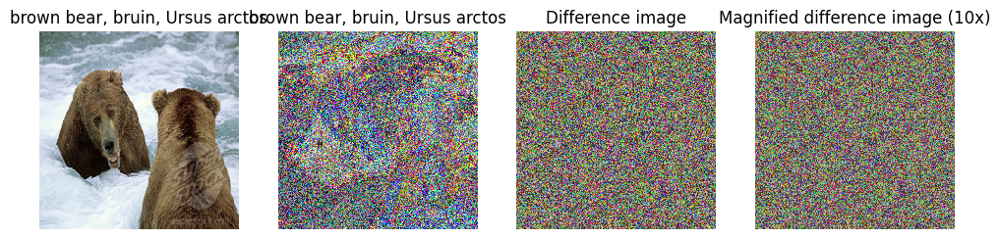

Probability of correct class "brown bear, bruin, Ursus arctos" for method FGSM and epsilon 8 after: 0.0000


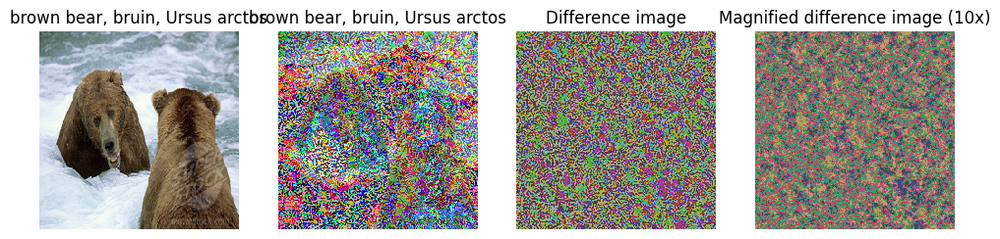

Probability of correct class "brown bear, bruin, Ursus arctos" for method Iterative and epsilon 8 after: 0.0000


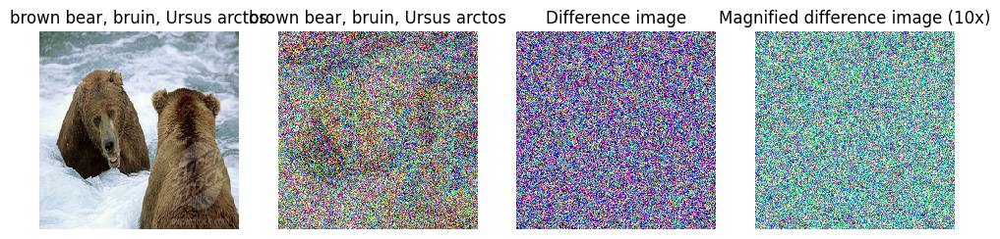

Probability of correct class "brown bear, bruin, Ursus arctos" for method FGSM and epsilon 16 after: 0.0000


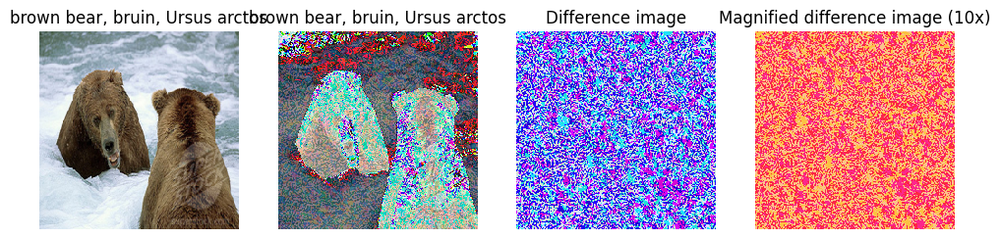

Probability of correct class "brown bear, bruin, Ursus arctos" for method Iterative and epsilon 16 after: 0.0000


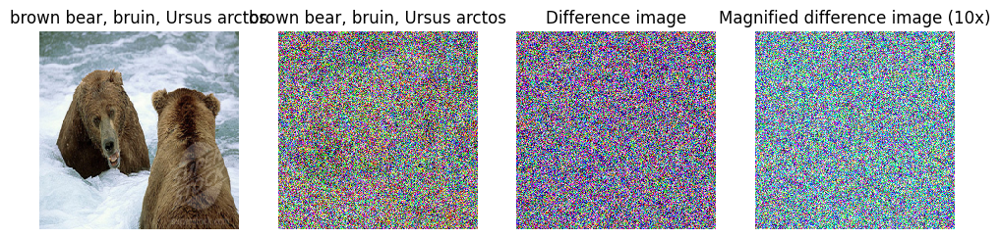

In [ ]:
import torch.nn.functional as F

def run_analysis(X, y, class_names):
    epsilons = [2, 4, 8, 16] # According to the instructions
    model = resnet18

    N = X.shape[0]
    for i in range(N): # This is the loop that goes over each image
        # Convert image to PyTorch tensor and add a batch dimension
        X_tensor = preprocess(Image.fromarray(X[i])).unsqueeze(0)

        # Get model predictions
        output = model(X_tensor)

        # Apply softmax to convert outputs to probabilities
        probs = F.softmax(output, dim=1)

        # Gather the probability of the correct class
        initial_prob = probs[0, y[i]]

        print(f'Probability of correct class {class_names[y[i]]} before: {initial_prob}')

        for eps in epsilons:
          for method in ['FGSM', 'Iterative']:
            if method == 'FGSM':
              adversarial_image_orig = fast_gradient_sign_method(X_tensor, torch.tensor([y[i]]), model, eps)
            else:
              adversarial_image_orig = iterative_method(X_tensor, torch.tensor([y[i]]), model, eps)

            output_adv = model(adversarial_image_orig)
            prob_adv = F.softmax(output_adv, dim= 1)
            adv_prob = prob_adv[0, y[i]].item()
            print(f'Probability of correct class "{class_names[y[i]]}" for method {method} and epsilon {eps} after: {adv_prob:.4f}')

            # Note - make sure that this visualization is included for all images / methods and all eps settings
            # You'll then visualize how the image changes by the various processes.
            adversarial_image_orig = adversarial_image_orig.squeeze(0)
            adversarial_image = deprocess(adversarial_image_orig.clone())
            adversarial_image = np.asarray(adversarial_image).astype(np.uint8)

            fig = plt.figure(i)
            plt.subplot(1, 4, 1)
            plt.imshow(X[i])  # Original image
            plt.title(class_names[y[i]])
            plt.axis('off')

            plt.subplot(1, 4, 2)
            plt.imshow(adversarial_image)  # Adversarial image
            plt.title(class_names[y[i]])
            plt.axis('off')

            plt.subplot(1, 4, 3)
            X_preprocessed = preprocess(Image.fromarray(X[i]))
            diff = np.asarray(deprocess(adversarial_image_orig.clone() - X_preprocessed))
            plt.imshow(diff)  # Difference image
            plt.title('Difference image')
            plt.axis('off')

            plt.subplot(1, 4, 4)
            diff = np.asarray(deprocess(10 * (adversarial_image_orig.clone() - X_preprocessed)))
            plt.imshow(diff)  # Magnified difference image
            plt.title('Magnified difference image (10x)')
            plt.axis('off')

            plt.gcf().set_size_inches(12, 5)
            plt.show()

X, y, class_names = load_data(num=5)  # X is a numpy array of size [5, 224, 224, 3] (5 images)
run_analysis(X, y, class_names)